# Processing the h5ad file Dafna created from the raw Single Cell data of turtle 3 and 1. After CCA analysis in R

## Imports

In [1]:
import numpy as np
import scanpy as sc
import os
import pandas as pd
import bbknn

## Single Cell settings

In [2]:
sc.settings.verbosity = 4
sc.settings.set_figure_params(80) 
sc.settings.file_format_figures = 'png'
sc.settings.savefigs = False
use_first_n_samples = 0
full_sparse = False

C:\Users\TzachiHNB2\AppData\Local\Temp\ipykernel_18332\738880785.py:2: FutureWarning: The specified parameters ('scanpy',) are no longer positional. Please specify them like `scanpy=80`
  sc.settings.set_figure_params(80)


## Defining a function for processing the data & determing the parameters

In [3]:
def processing_batch(adata, neighbors=15, key='batch', reso=0.4, random_state=0):  # Higher resolution yields more leiden clusters 
    sc.pp.scale(adata, max_value=10)
    sc.tl.pca(adata, svd_solver='arpack')
    sc.logging.print_memory_usage()
    sc.pp.neighbors(adata, n_neighbors=neighbors)
    sc.pl.pca_variance_ratio(adata, log=True)
    bbknn.bbknn(adata, batch_key=key, neighbors_within_batch=2, metric='euclidean', n_pcs=30, trim=None)
    sc.tl.umap(adata)
    sc.tl.leiden(adata, resolution=reso)
    sc.pl.umap(adata, color='leiden')

## Reading the h5ad file 

In [4]:
adata = sc.read(r'/Code/data/single_cell/animals/turtle/turtle_1_and_3/''turtles.h5ad') 

sc.read_h5ad(r'/Code/data/single_cell/animals/turtle/turtle_1_and_3/''turtles.h5ad') 

c:\Python\Python310\lib\site-packages\anndata\_core\anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
c:\Python\Python310\lib\site-packages\anndata\_core\anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 26575 × 22456
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'treatment', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_MT', 'pct_counts_MT', 'S_score', 'G2M_score', 'phase', 'sample', 'cca_clusters', 'seurat_clusters', 'ident'
    var: 'gene_ids', 'feature_types', 'protein_id', 'eggnog_name', 'MT', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'X_name'
    obsm: 'INTEGRATED.CCA', 'PCA', 'UMAP.CCA'
    layers: 'logcounts'

In [5]:
adata.var

,gene_ids,feature_types,protein_id,eggnog_name,MT,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
TYMP,TYMP,Gene Expression,XP_034618943.1,TYMP,False,104,0.007333,99.430854,134.0
SCO2,LOC117873559,Gene Expression,XP_034618957.1,SCO2,False,660,0.056258,96.388114,1028.0
NCAPH2,NCAPH2,Gene Expression,XP_034618969.1,NCAPH2,False,283,0.018224,98.451267,333.0
LMF2,LMF2,Gene Expression,XP_034618983.1,LMF2,False,1433,0.114759,92.157828,2097.0
MIOX,MIOX,Gene Expression,XP_034618997.1,MIOX,False,1,0.000055,99.994527,1.0
...,...,...,...,...,...,...,...,...,...
ND4L,ND4L,Gene Expression,YP_002317267.1,ND4L,False,0,0.000000,100.000000,0.0
MT-ND4,ND4,Gene Expression,YP_002317268.1,ND4,True,0,0.000000,100.000000,0.0
MT-ND5,ND5,Gene Expression,YP_002317269.1,ND5,True,0,0.000000,100.000000,0.0
MT-ND6,ND6,Gene Expression,YP_002317270.1,ND6,True,0,0.000000,100.000000,0.0


In [6]:
adata.obs

,orig.ident,nCount_RNA,nFeature_RNA,treatment,n_genes,n_genes_by_counts,total_counts,total_counts_MT,pct_counts_MT,S_score,G2M_score,phase,sample,cca_clusters,seurat_clusters,ident
AAACCCACAAGGGCAT-1-UNST_1,MyProject,828.0,458,UNST,458,458,828.0,0.0,0.0,0.009243,0.066585,G2M,turtle1,3,3,3
AAACCCACAGACCAAG-1-UNST_1,MyProject,438.0,316,UNST,316,316,438.0,0.0,0.0,-0.263388,-0.108363,G1,turtle1,8,8,8
AAACGAAGTGAATTAG-1-UNST_1,MyProject,466.0,327,UNST,327,327,466.0,0.0,0.0,-0.067388,-0.067509,G1,turtle1,5,5,5
AAACGAATCTCAATCT-1-UNST_1,MyProject,428.0,304,UNST,304,304,428.0,0.0,0.0,-0.060092,0.015213,G2M,turtle1,1,1,1
AAACGCTGTAGGCTGA-1-UNST_1,MyProject,715.0,440,UNST,440,440,715.0,0.0,0.0,-0.109562,-0.000623,G1,turtle1,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTTCCATCAGA-1-PIC_2,MyProject,2555.0,985,PIC,985,985,2555.0,0.0,0.0,-0.092155,0.061184,G2M,turtl3,0,0,0
TTTGGTTTCGTCGATA-1-PIC_2,MyProject,939.0,473,PIC,473,473,939.0,0.0,0.0,0.000514,-0.061481,S,turtl3,0,0,0
TTTGTTGAGCGAAACC-1-PIC_2,MyProject,3380.0,1004,PIC,1004,1004,3380.0,0.0,0.0,-0.159136,0.002162,G2M,turtl3,3,3,3
TTTGTTGCACGAAAGC-1-PIC_2,MyProject,1458.0,761,PIC,761,761,1458.0,0.0,0.0,-0.165921,-0.054590,G1,turtl3,0,0,0


## Preprocessing the data 

### Cleaning, normalizing, reducing dimensionality, clustering cells and creating visualizations

normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    Gene indices [ 6699  7153 20402] fell into a single bin: their normalized dispersion was set to 1.
    Decreasing `n_bins` will likely avoid this effect.
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


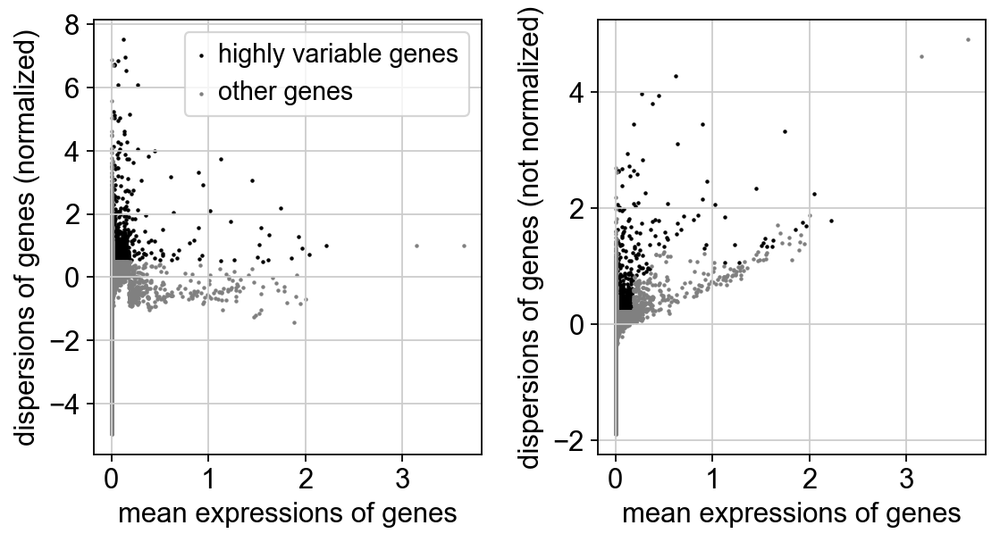

In [7]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata)
adata.raw = adata

In [8]:
sc.pp.regress_out(adata, ['total_counts','pct_counts_MT'])

# Got it from: https://github.com/theislab/single-cell-tutorial/issues/35
sc.pp.scale(adata, max_value=10)
sc.pp.pca(adata, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata)
sc.tl.umap(adata) 

regressing out ['total_counts', 'pct_counts_MT']
    sparse input is densified and may lead to high memory use
    finished (0:04:48)
    ... clipping at max_value 10
computing PCA


c:\Python\Python310\lib\site-packages\scanpy\preprocessing\_pca.py:374: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


    with n_comps=50
    finished (0:00:13)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:37)
    computed connectivities (0:00:02)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:40)
computing UMAP


  0%|          | 0/200 [00:00<?, ?it/s]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:18)


    ... clipping at max_value 10
computing PCA
    with n_comps=50
    finished (0:00:13)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)
Memory usage: current 5.21 GB, difference +5.21 GB
computing neighbors
        initialized `.distances` `.connectivities` 
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:04)
    computed connectivities (0:00:00)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)


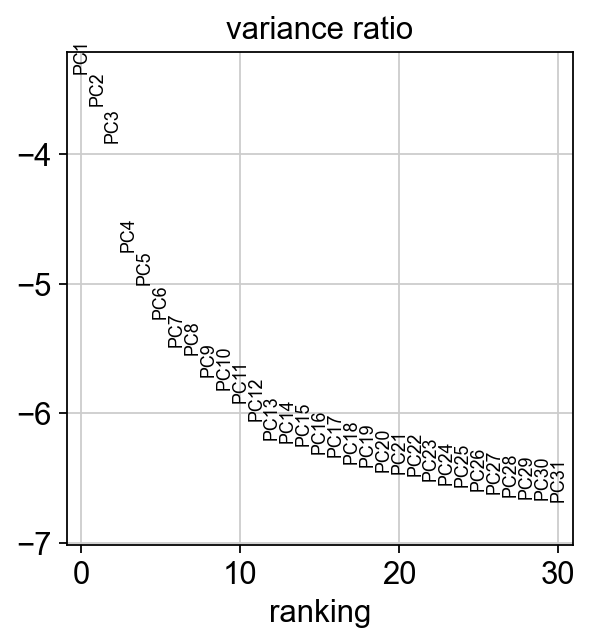

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP


  0%|          | 0/200 [00:00<?, ?it/s]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:14)
running Leiden clustering


C:\Users\TzachiHNB2\AppData\Local\Temp\ipykernel_18332\2800874316.py:9: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=reso)


    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


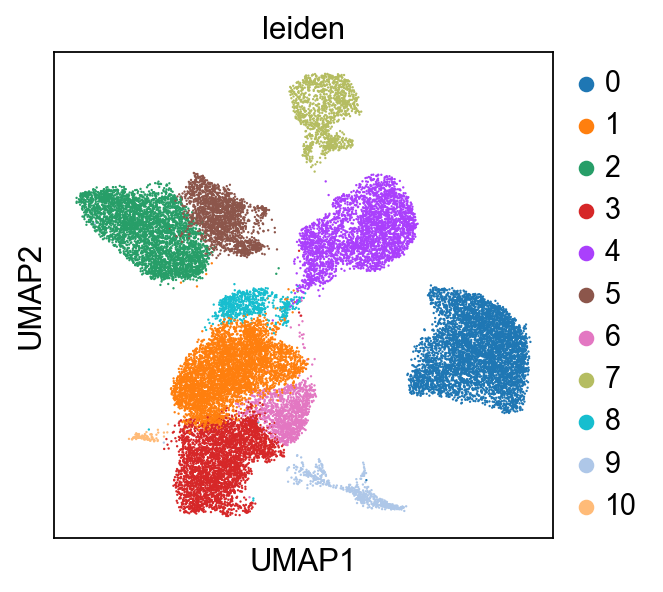

In [9]:
processing_batch(adata, key='treatment') 

In [10]:
adata.obs['treatment'].value_counts()

treatment
LPS     9592
PIC     6272
UNST    5361
LF      5350
Name: count, dtype: int64

In [11]:
adata.obs['treatment'] = adata.obs['treatment'].map({'UNST': 'control','LPS': 'lps', 'PIC': 'pic', 'LF':'lf'})

In [12]:
adata.obs

,orig.ident,nCount_RNA,nFeature_RNA,treatment,n_genes,n_genes_by_counts,total_counts,total_counts_MT,pct_counts_MT,S_score,G2M_score,phase,sample,cca_clusters,seurat_clusters,ident,leiden
AAACCCACAAGGGCAT-1-UNST_1,MyProject,828.0,458,control,458,458,828.0,0.0,0.0,0.009243,0.066585,G2M,turtle1,3,3,3,1
AAACCCACAGACCAAG-1-UNST_1,MyProject,438.0,316,control,316,316,438.0,0.0,0.0,-0.263388,-0.108363,G1,turtle1,8,8,8,9
AAACGAAGTGAATTAG-1-UNST_1,MyProject,466.0,327,control,327,327,466.0,0.0,0.0,-0.067388,-0.067509,G1,turtle1,5,5,5,2
AAACGAATCTCAATCT-1-UNST_1,MyProject,428.0,304,control,304,304,428.0,0.0,0.0,-0.060092,0.015213,G2M,turtle1,1,1,1,2
AAACGCTGTAGGCTGA-1-UNST_1,MyProject,715.0,440,control,440,440,715.0,0.0,0.0,-0.109562,-0.000623,G1,turtle1,2,2,2,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTTCCATCAGA-1-PIC_2,MyProject,2555.0,985,pic,985,985,2555.0,0.0,0.0,-0.092155,0.061184,G2M,turtl3,0,0,0,0
TTTGGTTTCGTCGATA-1-PIC_2,MyProject,939.0,473,pic,473,473,939.0,0.0,0.0,0.000514,-0.061481,S,turtl3,0,0,0,0
TTTGTTGAGCGAAACC-1-PIC_2,MyProject,3380.0,1004,pic,1004,1004,3380.0,0.0,0.0,-0.159136,0.002162,G2M,turtl3,3,3,3,1
TTTGTTGCACGAAAGC-1-PIC_2,MyProject,1458.0,761,pic,761,761,1458.0,0.0,0.0,-0.165921,-0.054590,G1,turtl3,0,0,0,0


In [13]:
adata.obs['treatment'].value_counts()

treatment
lps        9592
pic        6272
control    5361
lf         5350
Name: count, dtype: int64

### UMAP's

#### T cells

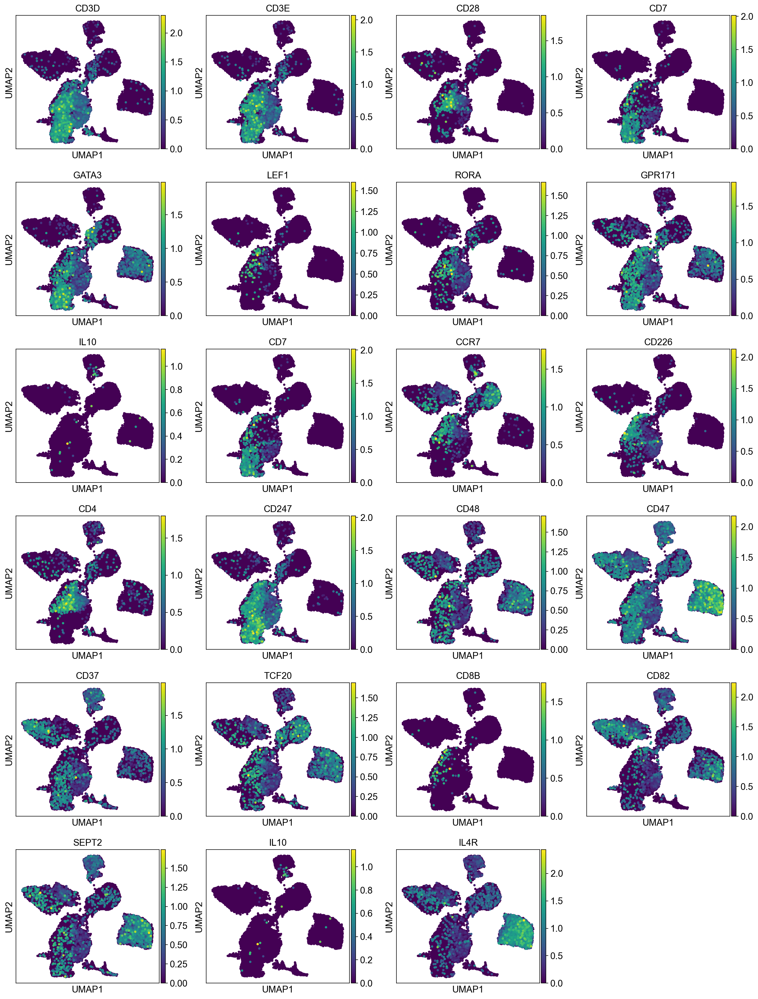

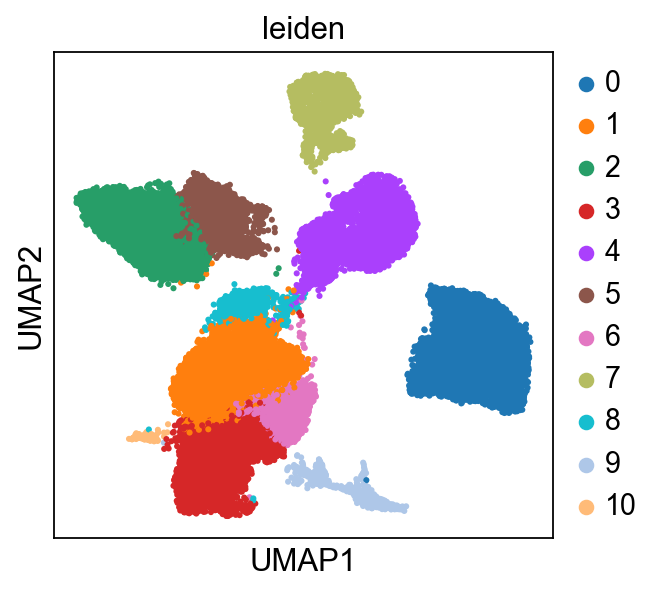

In [124]:
sc.pl.umap(adata, color=['CD3D','CD3E','CD28','CD7','GATA3',
                         'LEF1','RORA','GPR171','IL10','CD7',
                         'CCR7','CD226','CD4','CD247','CD48',
                         'CD47','CD37','TCF20','CD8B','CD82',
                         'SEPT2','IL10','IL4R'], size=50)
sc.pl.umap(adata, color='leiden', size=30)

#### B cells

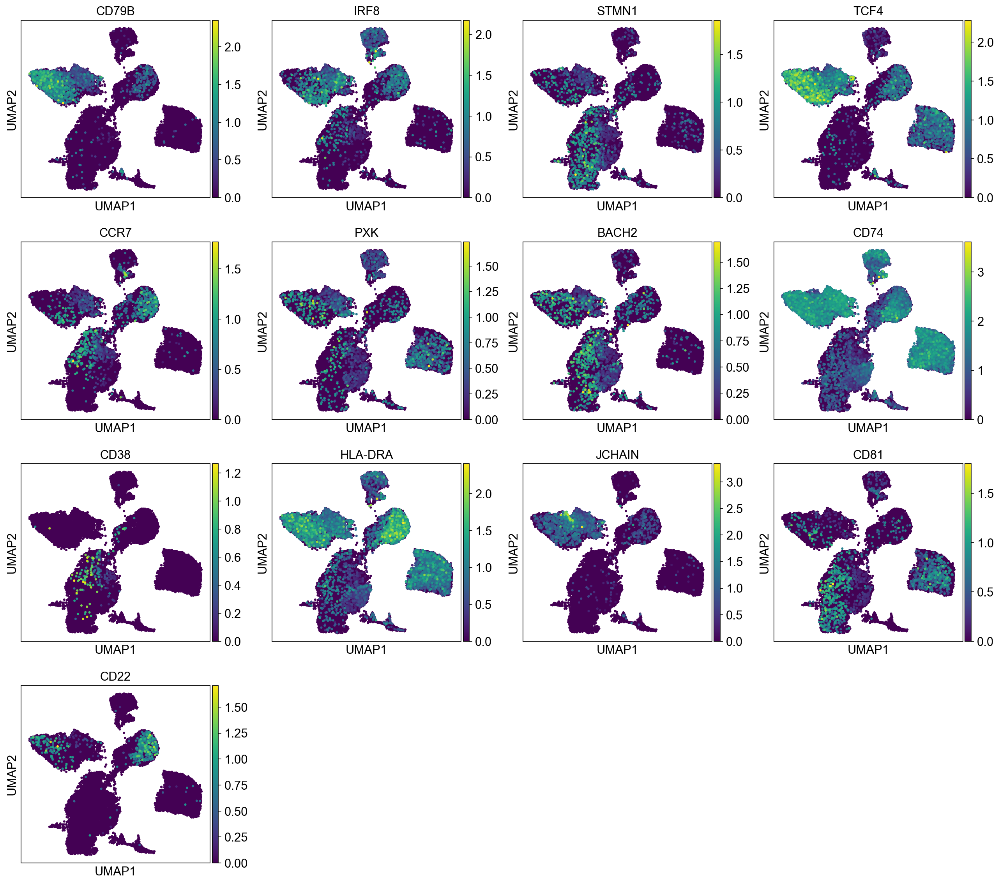

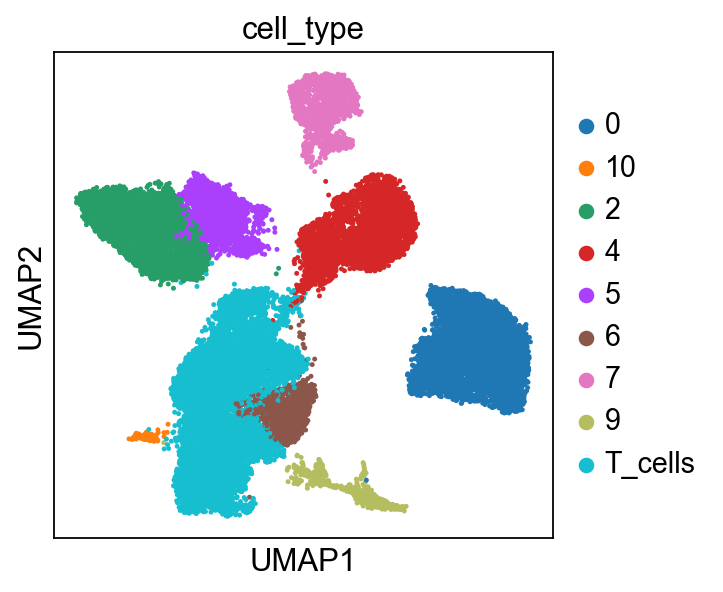

In [103]:
sc.pl.umap(adata, color=['CD79B','IRF8','STMN1','TCF4',
                         'CCR7','PXK','BACH2','CD74','CD38','HLA-DRA',
                         'JCHAIN','CD81','CD22'], size=30) 

celltype = {'0':'0','1':'T_cells','2':'2','3':'T_cells','4':'4','5':'5','6':'T_cells','7':'7','8':'T_cells','9':'9','10':'10'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=20)

#### RBC

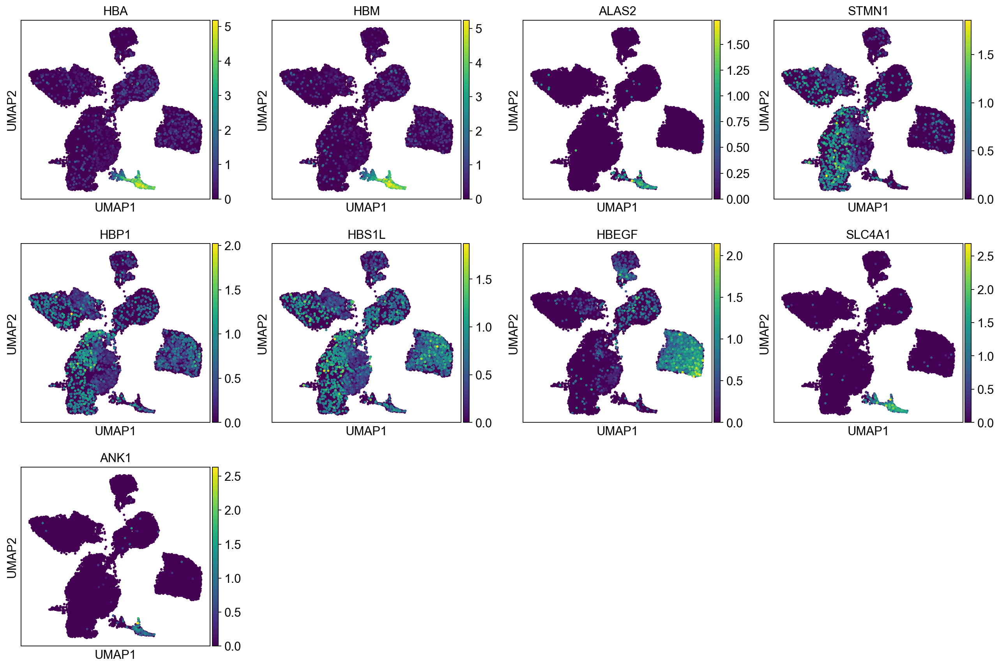

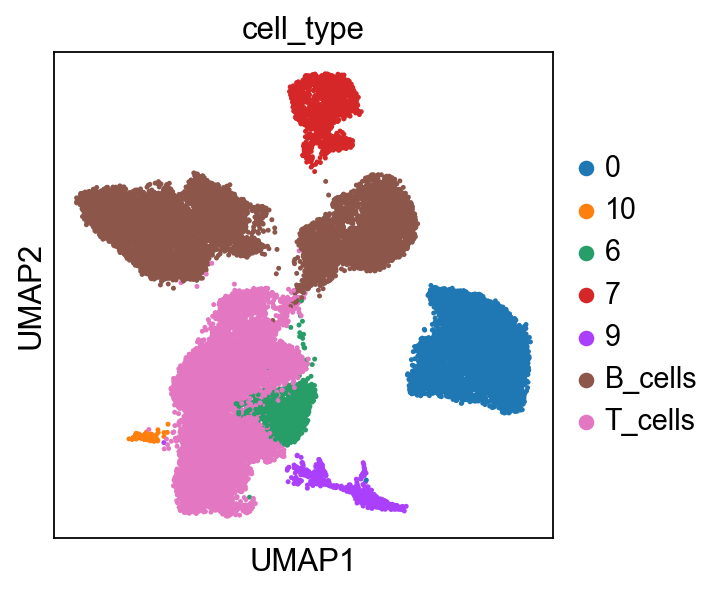

In [104]:
sc.pl.umap(adata, color=['HBA','HBM','ALAS2','STMN1','HBP1','HBS1L','HBEGF','SLC4A1','ANK1'], size=30) 

celltype = {'0':'0','1':'T_cells','2':'B_cells','3':'T_cells','4':'B_cells','5':'B_cells','6':'T_cells','7':'7','8':'T_cells','9':'9','10':'10'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=20)

#### Monocytes

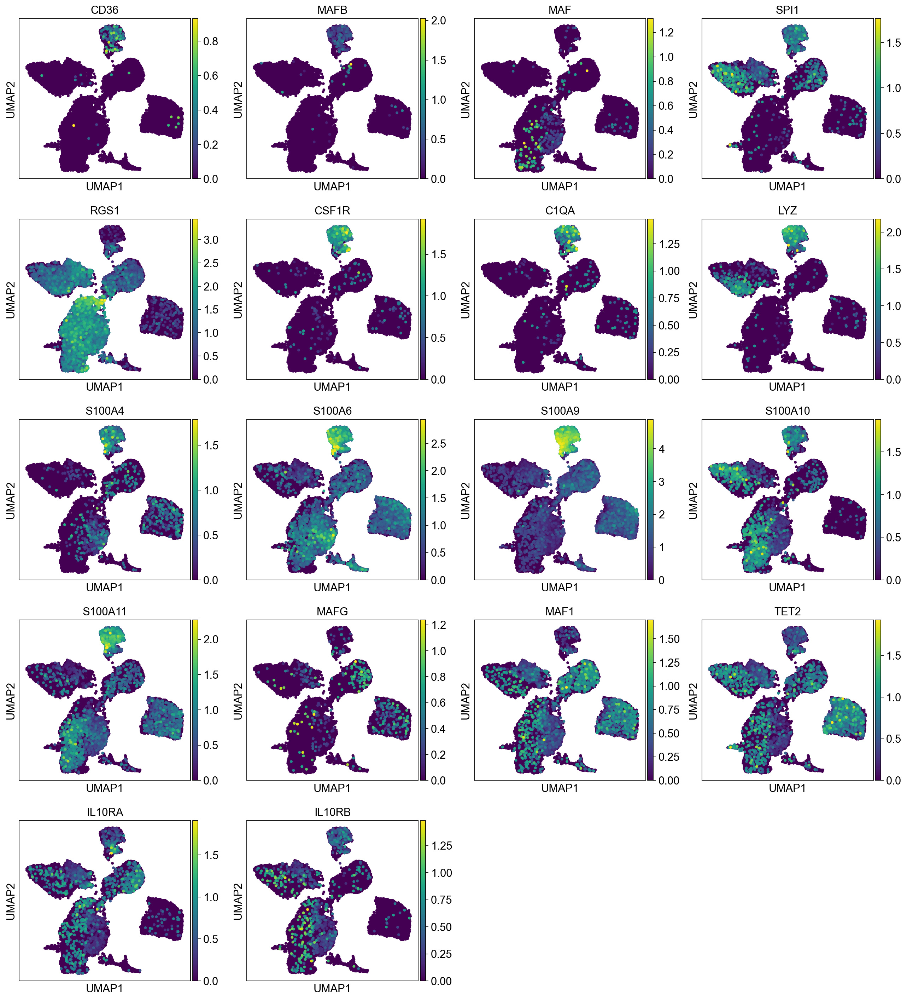

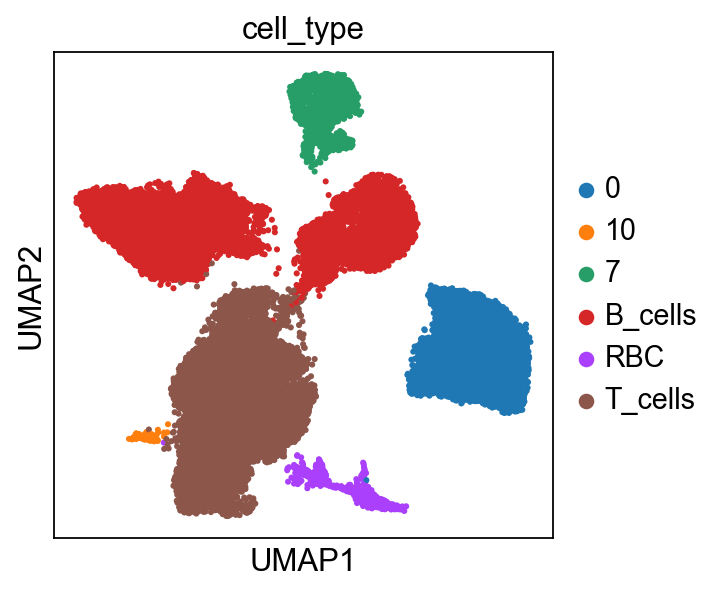

In [118]:
sc.pl.umap(adata, color=['CD36','MAFB','MAF','SPI1','RGS1','CSF1R',
                         'C1QA','LYZ','S100A4','S100A6','S100A9',
                         'S100A10','S100A11','MAFG','MAF1','TET2',
                         'IL10RA','IL10RB'], size=50)

celltype = {'0':'0','1':'T_cells','2':'B_cells','3':'T_cells','4':'B_cells','5':'B_cells','6':'T_cells','7':'7','8':'T_cells','9':'RBC','10':'10'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=30)

#### Platelets

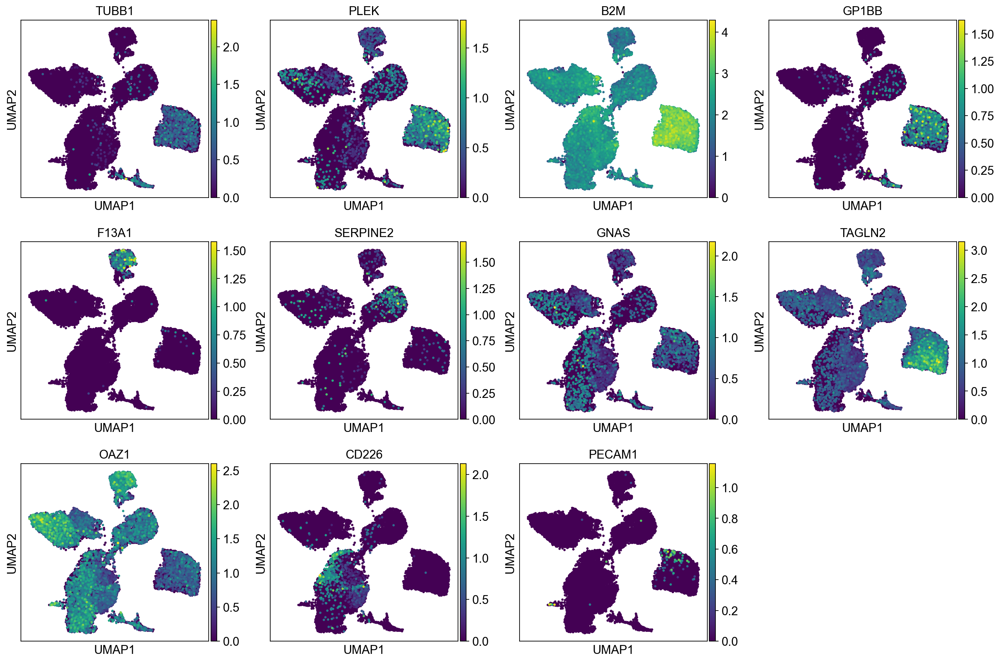

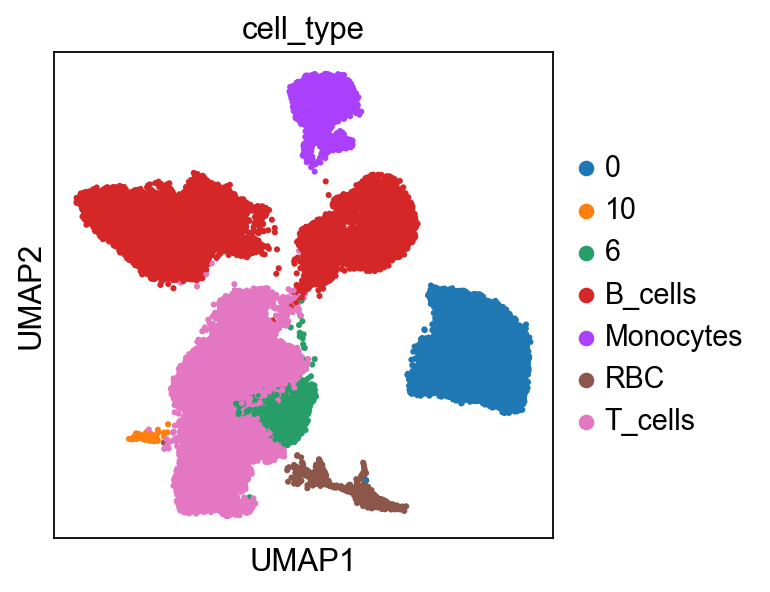

In [106]:
sc.pl.umap(adata, color=['TUBB1','PLEK','B2M','GP1BB','F13A1',
                         'SERPINE2','GNAS','TAGLN2','OAZ1','CD226',
                         'PECAM1'], size=30)

celltype = {'0':'0','1':'T_cells','2':'B_cells','3':'T_cells','4':'B_cells','5':'B_cells','6':'T_cells','7':'Monocytes','8':'T_cells','9':'RBC','10':'10'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=30)

#### All clusters

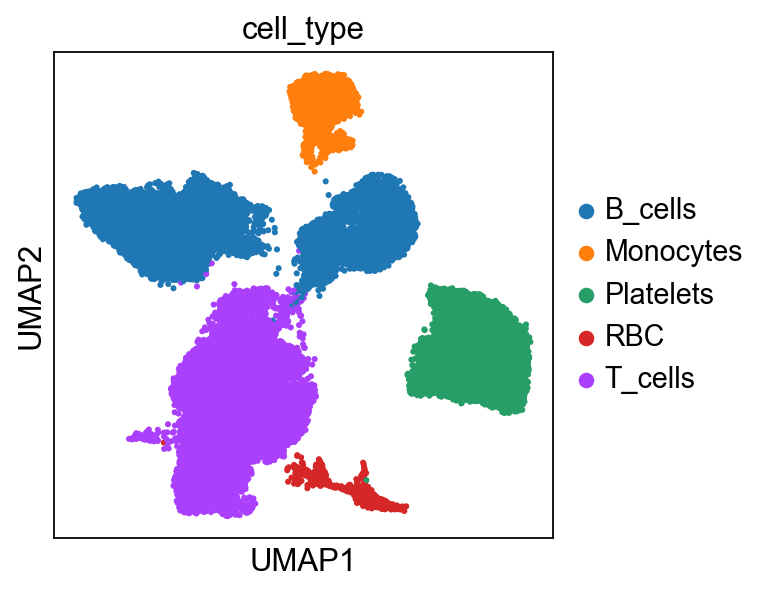

In [126]:
celltype = {'0':'Platelets','1':'T_cells','2':'B_cells','3':'T_cells','4':'B_cells','5':'B_cells','6':'T_cells','7':'Monocytes','8':'T_cells','9':'RBC','10':'T_cells'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=30)

In [127]:
adata.obs['cell_type'].value_counts()

cell_type
T_cells      10196
B_cells       9226
Platelets     5396
Monocytes     1195
RBC            562
Name: count, dtype: int64

### TLR genes in adata by treatment

In [75]:
TLR_genes = ['TLR8','TLR7','TLR5','TLR3','TLR4']

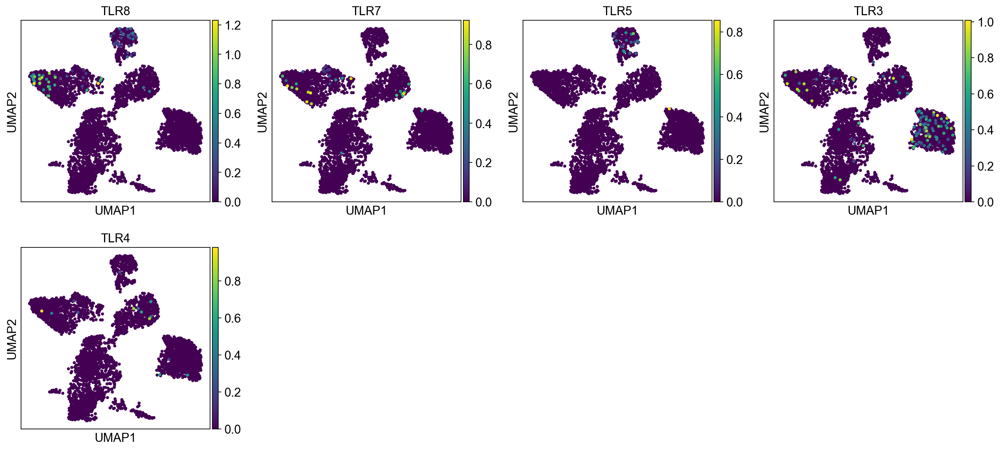

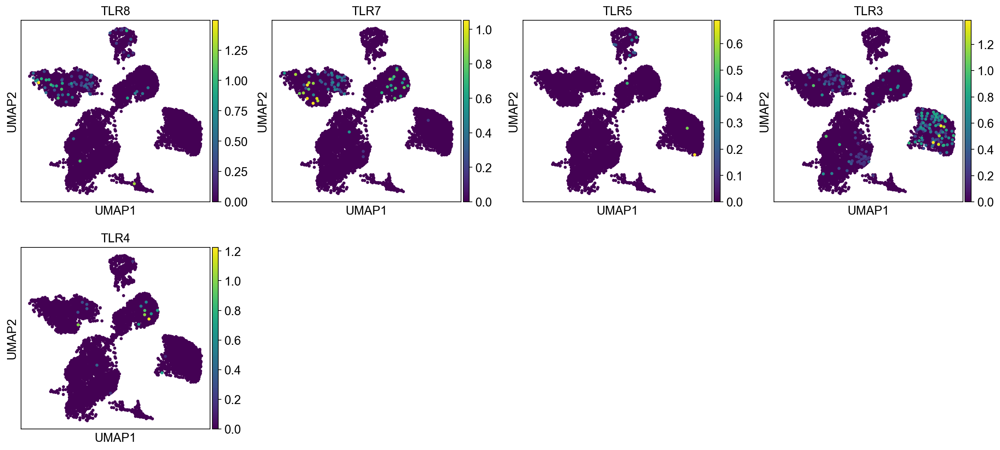

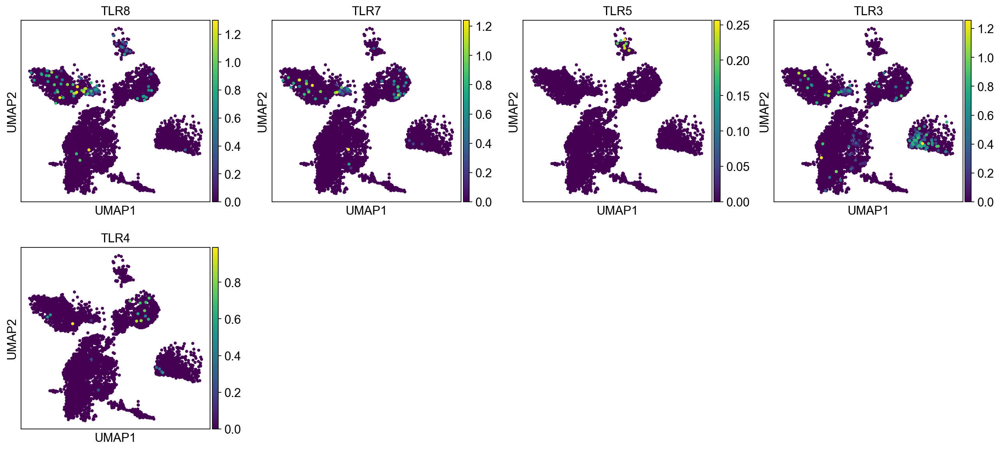

In [78]:
sc.pl.umap(adata[adata.obs['treatment'] == 'control'], color=TLR_genes, size=50)
# sc.pl.dotplot(adata, TLR_genes, groupby='treatment', standard_scale='var')

sc.pl.umap(adata[adata.obs['treatment'] == 'lps'], color=TLR_genes, size=50)
# sc.pl.dotplot(adata, TLR_genes, groupby='treatment', standard_scale='var')

sc.pl.umap(adata[adata.obs['treatment'] == 'pic'], color=TLR_genes, size=50)
# sc.pl.dotplot(adata, TLR_genes, groupby='treatment', standard_scale='var')

### ISG genes 

In [ ]:
#

## Gene search tools
This function returns a list of genes that are present in adata (markers for example) from an input of a general list.

In [125]:
def find_gene(gene):
    GENES = list(adata.raw.var.index[adata.raw.var.index.str.startswith(gene.upper())])
    return GENES

find_gene('TCF')

['TCF20',
 'TCF7L1',
 'TCF24',
 'TCF21',
 'TCF4',
 'TCF7L2',
 'TCF7',
 'TCF12',
 'TCF12',
 'TCF15',
 'TCFL5',
 'TCF25',
 'TCF3']